# Image Scrapping and Classification (Modelling)

In [1]:
import os
from os import listdir

In [2]:
train_data=r'Clothes/Train'
test_data=r'Clothes/Test'

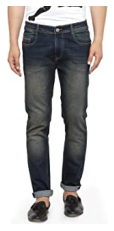

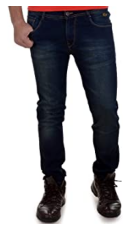

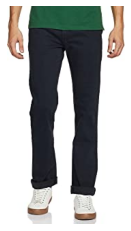

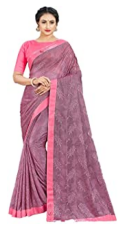

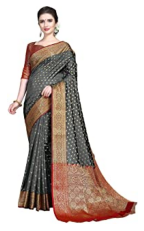

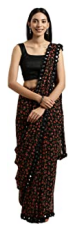

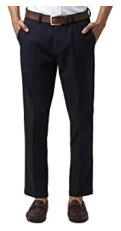

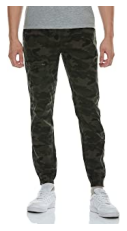

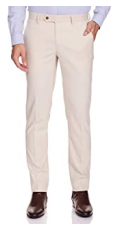

In [3]:
# Let's try to print some of the scrapped images from each category
import matplotlib.image as mpimg
import matplotlib.pyplot as plt

train_jeans=r'Clothes/Train/Jeans_Images'
train_saree=r'Clothes/Train/Sarees_Images'
train_trouser=r'Clothes/Train/Trousers_Images'


Cloth_train=[train_jeans, train_saree, train_trouser]
for dirs in Cloth_train:
    k=listdir(dirs)
    for i in k[:3]:
        img=mpimg.imread('{}/{}'.format(dirs,i))
        plt.imshow(img)
        plt.axis('off')
        plt.show()

In [4]:
file1 = os.listdir(r'Clothes/Train')
file1

['Jeans_Images', 'Sarees_Images', 'Trousers_Images']

In [5]:
file2 = os.listdir(r'Clothes/Test')
file2

['Jeans_Images', 'Sarees_Images', 'Trousers_Images']

In [6]:
print("Count of Training Images")
print("No.of Images of Sarees in train dataset -> ",len(os.listdir(r'Clothes/Train/Sarees_Images')))
print("No.of Images of Jeans in train dataset -> ",len(os.listdir(r'Clothes/Train/Jeans_Images')))
print("No.of Images of Trousers in train dataset ->",len(os.listdir(r'Clothes/Train/Trousers_Images')))
"\n"

print("Count of Test Images")
print("No.of Images of Sarees in test dataset-> ",len(os.listdir(r'Clothes/Test/Sarees_Images')))
print("No.of Images of Jeans in test dataset ->",len(os.listdir(r'Clothes/Test/Jeans_Images')))
print("No.of Images of Trousers in test dataset-> ",len(os.listdir(r'Clothes/Test/Trousers_Images')))

Count of Training Images
No.of Images of Sarees in train dataset ->  250
No.of Images of Jeans in train dataset ->  250
No.of Images of Trousers in train dataset -> 250
Count of Test Images
No.of Images of Sarees in test dataset->  126
No.of Images of Jeans in test dataset -> 126
No.of Images of Trousers in test dataset->  126


In [7]:
#importing all the required libraries
import pandas as pd
import numpy as np
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Dropout, Activation, Conv2D, MaxPooling2D,BatchNormalization
from tensorflow.keras import optimizers
from keras.models import load_model
from tensorflow.keras.preprocessing import image
import random
import scipy
import pylab as pl
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import warnings 
warnings.filterwarnings("ignore")

In [8]:
#Defining dimensions of images and other parameters
input_shape=(128,128,3)
img_width=128
img_height=128
batch_size=12
epoch=100
train_samples=250
test_samples=118

In [9]:
# Data Augmentation on Training Images

Train_datagen=ImageDataGenerator(rescale=1./255,
                                             zoom_range=0.2,
                                             rotation_range=30,
                                             horizontal_flip=True)
Training_set=Train_datagen.flow_from_directory(train_data,
                                                              target_size=(img_width,img_height),
                                                              batch_size=batch_size, 
                                                              class_mode='categorical')

# Test Data Generator
Test_datagen=ImageDataGenerator(rescale=1./255)
Test_set=Test_datagen.flow_from_directory(test_data,
                                                  target_size=(img_width,img_height),
                                                  batch_size=batch_size, 
                                                  class_mode='categorical')

Found 750 images belonging to 3 classes.
Found 378 images belonging to 3 classes.


In [10]:
# Creating the model
model=Sequential()

# First convolution layer
model.add(Conv2D(32,(3,3),input_shape=input_shape))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.25))

# Second convolution layer
model.add(Conv2D(32,(3,3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.25))

# Third convolution layer
model.add(Conv2D(64,(3,3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.25))

# Fourth convolution layer
model.add(Conv2D(64,(3,3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.25))


model.add(Flatten())
model.add(Dense(128))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(3))
model.add(Activation('softmax'))

print(model.summary())

model.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 126, 126, 32)      896       
_________________________________________________________________
activation (Activation)      (None, 126, 126, 32)      0         
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 63, 63, 32)        0         
_________________________________________________________________
dropout (Dropout)            (None, 63, 63, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 61, 61, 32)        9248      
_________________________________________________________________
activation_1 (Activation)    (None, 61, 61, 32)        0         
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 30, 30, 32)        0

In [11]:
# Defining Early stopping and Model check point
from keras.callbacks import EarlyStopping
from keras.callbacks import ModelCheckpoint

ES = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=30)
MC = ModelCheckpoint('best.h5', monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)

In [12]:
# Fitting the Training Data
history = model.fit(
    Training_set, 
    epochs=epoch,
    validation_data=Test_set,
    validation_steps=test_samples//batch_size,
    steps_per_epoch=train_samples//batch_size,
    callbacks=[ES,MC])

Epoch 1/100
20/20 [==============================] - 7s 318ms/step - loss: 1.1634 - accuracy: 0.3250 - val_loss: 1.0863 - val_accuracy: 0.5648

Epoch 00001: val_accuracy improved from -inf to 0.56481, saving model to best.h5
Epoch 2/100
20/20 [==============================] - 5s 243ms/step - loss: 1.0150 - accuracy: 0.4658 - val_loss: 0.9229 - val_accuracy: 0.6667

Epoch 00002: val_accuracy improved from 0.56481 to 0.66667, saving model to best.h5
Epoch 3/100
20/20 [==============================] - 4s 205ms/step - loss: 0.7390 - accuracy: 0.6208 - val_loss: 0.7042 - val_accuracy: 0.7685

Epoch 00003: val_accuracy improved from 0.66667 to 0.76852, saving model to best.h5
Epoch 4/100
20/20 [==============================] - 4s 183ms/step - loss: 0.6753 - accuracy: 0.5897 - val_loss: 0.6856 - val_accuracy: 0.6759

Epoch 00004: val_accuracy did not improve from 0.76852
Epoch 5/100
20/20 [==============================] - 4s 175ms/step - loss: 0.6104 - accuracy: 0.6292 - val_loss: 0.5043 

20/20 [==============================] - 3s 144ms/step - loss: 0.4057 - accuracy: 0.8120 - val_loss: 0.4114 - val_accuracy: 0.7870

Epoch 00081: val_accuracy did not improve from 0.91667
Epoch 82/100
20/20 [==============================] - 3s 148ms/step - loss: 0.3201 - accuracy: 0.8417 - val_loss: 0.3249 - val_accuracy: 0.8611

Epoch 00082: val_accuracy did not improve from 0.91667
Epoch 83/100
20/20 [==============================] - 3s 148ms/step - loss: 0.2748 - accuracy: 0.8875 - val_loss: 0.2720 - val_accuracy: 0.8981

Epoch 00083: val_accuracy did not improve from 0.91667
Epoch 84/100
20/20 [==============================] - 3s 149ms/step - loss: 0.2395 - accuracy: 0.8958 - val_loss: 0.2477 - val_accuracy: 0.8796

Epoch 00084: val_accuracy did not improve from 0.91667
Epoch 85/100
20/20 [==============================] - 3s 148ms/step - loss: 0.2355 - accuracy: 0.8833 - val_loss: 0.1624 - val_accuracy: 0.9259

Epoch 00085: val_accuracy improved from 0.91667 to 0.92593, saving m

In [13]:
#Saving the best model
model.save('best_model.h5')

In [14]:
losses = pd.DataFrame(model.history.history)
losses

,loss,accuracy,val_loss,val_accuracy
0,1.163439,0.325000,1.086341,0.564815
1,1.015001,0.465812,0.922880,0.666667
2,0.738990,0.620833,0.704198,0.768519
3,0.675312,0.589744,0.685559,0.675926
4,0.610409,0.629167,0.504257,0.703704
...,...,...,...,...
95,0.365366,0.833333,0.276568,0.879630
96,0.246001,0.875000,0.224810,0.851852
97,0.277133,0.867521,0.217455,0.916667
98,0.258594,0.871795,0.395345,0.777778


### Prediction

In [15]:
#Loading the saved model
saved_model = load_model('best_model.h5')

In [16]:
#creating instances where elements from test directory will be called
test_jeans=r'Clothes/Test/Jeans_Images'
test_saree=r'Clothes/Test/Sarees_Images'
test_trouser=r'Clothes/Test/Trousers_Images'

## Displaying Predicted images

Input Image is: img251.jpeg


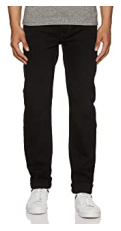

Predicted Label is: [2] 

Input Image is: img252.jpeg


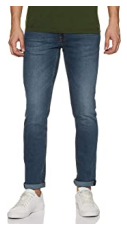

Predicted Label is: [2] 

Input Image is: img253.jpeg


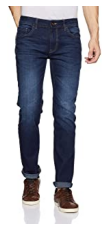

Predicted Label is: [2] 

Input Image is: img254.jpeg


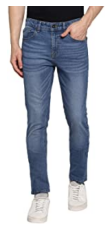

Predicted Label is: [2] 

Input Image is: img255.jpeg


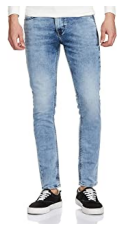

Predicted Label is: [2] 

Input Image is: img256.jpeg


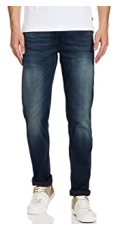

Predicted Label is: [0] 

Input Image is: img257.jpeg


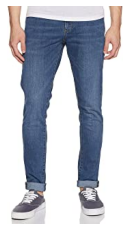

Predicted Label is: [2] 

Input Image is: img258.jpeg


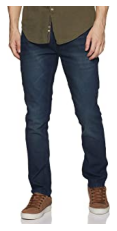

Predicted Label is: [2] 

Input Image is: img259.jpeg


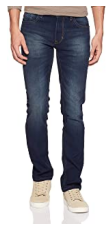

Predicted Label is: [0] 

Input Image is: img260.jpeg


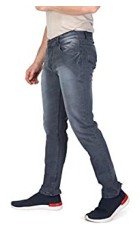

Predicted Label is: [2] 

Input Image is: img261.jpeg


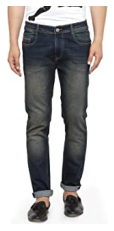

Predicted Label is: [2] 

Input Image is: img262.jpeg


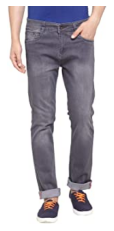

Predicted Label is: [2] 

Input Image is: img263.jpeg


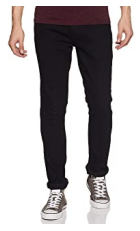

Predicted Label is: [0] 

Input Image is: img264.jpeg


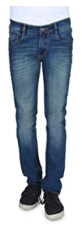

Predicted Label is: [2] 

Input Image is: img265.jpeg


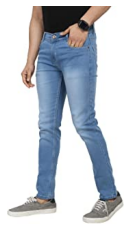

Predicted Label is: [2] 

Input Image is: img266.jpeg


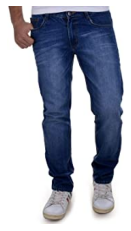

Predicted Label is: [2] 

Input Image is: img267.jpeg


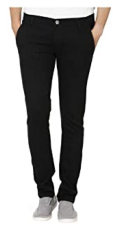

Predicted Label is: [2] 

Input Image is: img268.jpeg


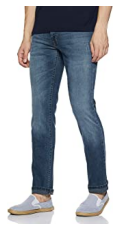

Predicted Label is: [2] 

Input Image is: img269.jpeg


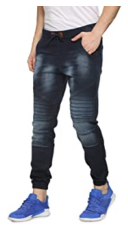

Predicted Label is: [2] 

Input Image is: img270.jpeg


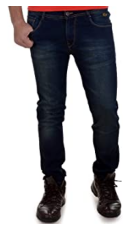

Predicted Label is: [0] 

Input Image is: img271.jpeg


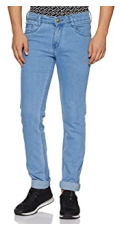

Predicted Label is: [2] 

Input Image is: img272.jpeg


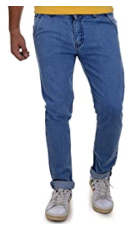

Predicted Label is: [0] 

Input Image is: img273.jpeg


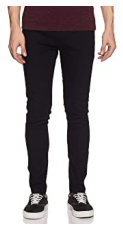

Predicted Label is: [2] 

Input Image is: img274.jpeg


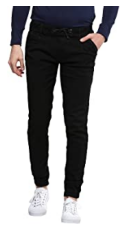

Predicted Label is: [2] 

Input Image is: img275.jpeg


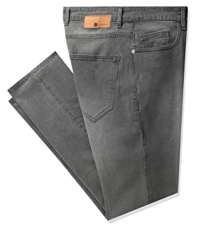

Predicted Label is: [2] 

Input Image is: img276.jpeg


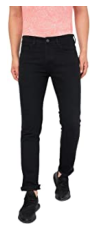

Predicted Label is: [0] 

Input Image is: img277.jpeg


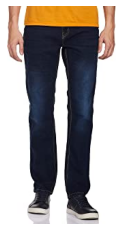

Predicted Label is: [0] 

Input Image is: img278.jpeg


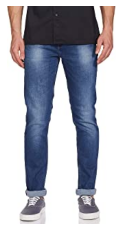

Predicted Label is: [2] 

Input Image is: img279.jpeg


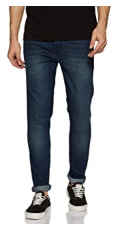

Predicted Label is: [2] 

Input Image is: img280.jpeg


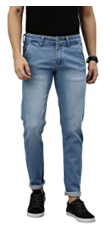

Predicted Label is: [2] 

Input Image is: img281.jpeg


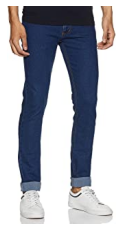

Predicted Label is: [2] 

Input Image is: img282.jpeg


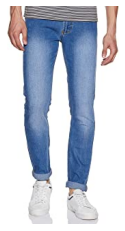

Predicted Label is: [2] 

Input Image is: img283.jpeg


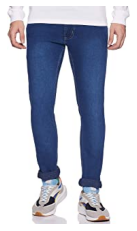

Predicted Label is: [0] 

Input Image is: img284.jpeg


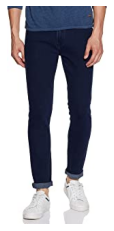

Predicted Label is: [2] 

Input Image is: img285.jpeg


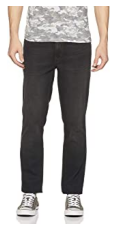

Predicted Label is: [2] 

Input Image is: img286.jpeg


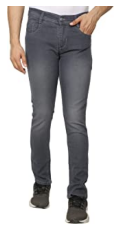

Predicted Label is: [2] 

Input Image is: img287.jpeg


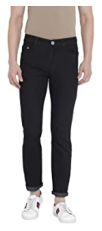

Predicted Label is: [0] 

Input Image is: img288.jpeg


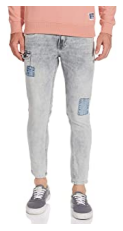

Predicted Label is: [2] 

Input Image is: img289.jpeg


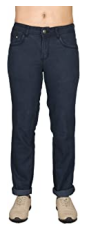

Predicted Label is: [0] 

Input Image is: img290.jpeg


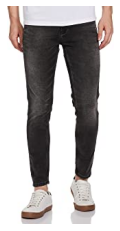

Predicted Label is: [2] 

Input Image is: img291.jpeg


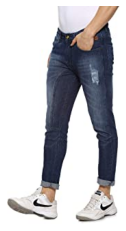

Predicted Label is: [2] 

Input Image is: img292.jpeg


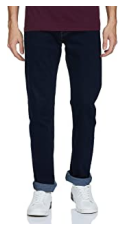

Predicted Label is: [0] 

Input Image is: img293.jpeg


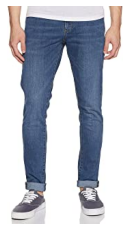

Predicted Label is: [2] 

Input Image is: img294.jpeg


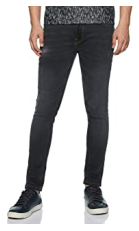

Predicted Label is: [2] 

Input Image is: img295.jpeg


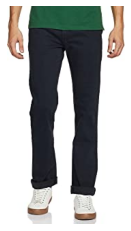

Predicted Label is: [2] 

Input Image is: img296.jpeg


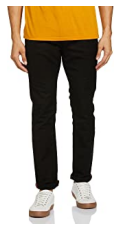

Predicted Label is: [0] 

Input Image is: img297.jpeg


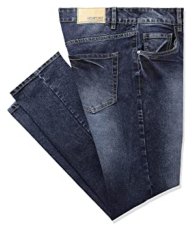

Predicted Label is: [2] 

Input Image is: img298.jpeg


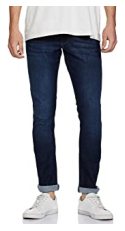

Predicted Label is: [0] 

Input Image is: img299.jpeg


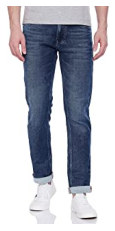

Predicted Label is: [0] 

Input Image is: img300.jpeg


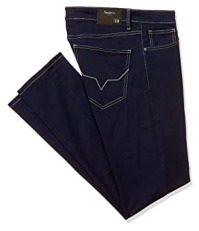

Predicted Label is: [0] 

Input Image is: img301.jpeg


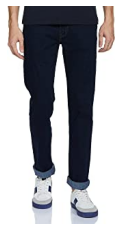

Predicted Label is: [0] 

Input Image is: img302.jpeg


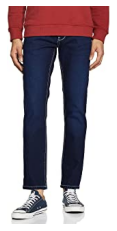

Predicted Label is: [0] 

Input Image is: img303.jpeg


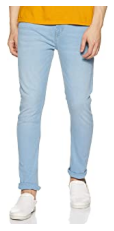

Predicted Label is: [0] 

Input Image is: img304.jpeg


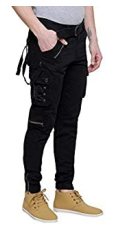

Predicted Label is: [0] 

Input Image is: img305.jpeg


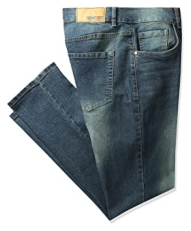

Predicted Label is: [0] 

Input Image is: img306.jpeg


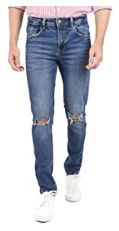

Predicted Label is: [2] 

Input Image is: img307.jpeg


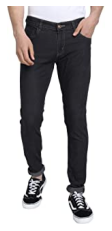

Predicted Label is: [2] 

Input Image is: img308.jpeg


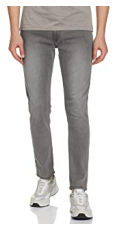

Predicted Label is: [2] 

Input Image is: img309.jpeg


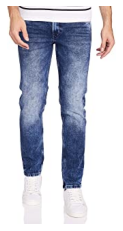

Predicted Label is: [2] 

Input Image is: img310.jpeg


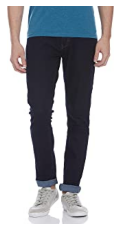

Predicted Label is: [2] 

Input Image is: img311.jpeg


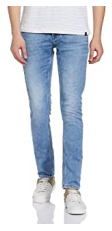

Predicted Label is: [2] 

Input Image is: img312.jpeg


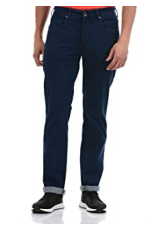

Predicted Label is: [2] 

Input Image is: img313.jpeg


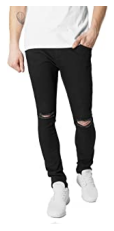

Predicted Label is: [0] 

Input Image is: img314.jpeg


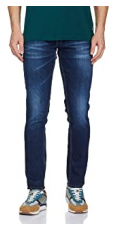

Predicted Label is: [0] 

Input Image is: img315.jpeg


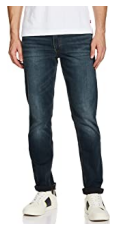

Predicted Label is: [2] 

Input Image is: img316.jpeg


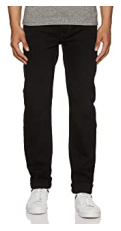

Predicted Label is: [2] 

Input Image is: img317.jpeg


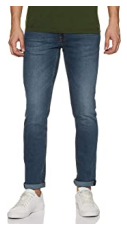

Predicted Label is: [2] 

Input Image is: img318.jpeg


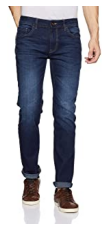

Predicted Label is: [2] 

Input Image is: img319.jpeg


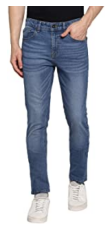

Predicted Label is: [2] 

Input Image is: img320.jpeg


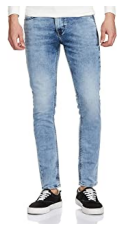

Predicted Label is: [2] 

Input Image is: img321.jpeg


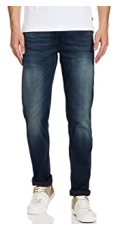

Predicted Label is: [0] 

Input Image is: img322.jpeg


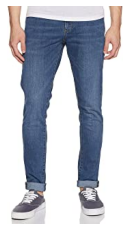

Predicted Label is: [2] 

Input Image is: img323.jpeg


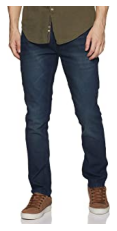

Predicted Label is: [2] 

Input Image is: img324.jpeg


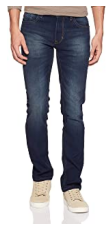

Predicted Label is: [0] 

Input Image is: img325.jpeg


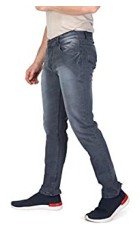

Predicted Label is: [2] 

Input Image is: img326.jpeg


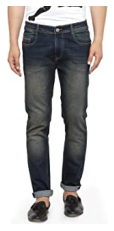

Predicted Label is: [2] 

Input Image is: img327.jpeg


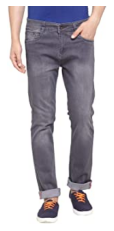

Predicted Label is: [2] 

Input Image is: img328.jpeg


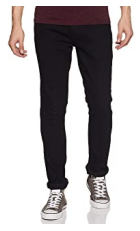

Predicted Label is: [0] 

Input Image is: img329.jpeg


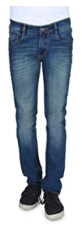

Predicted Label is: [2] 

Input Image is: img330.jpeg


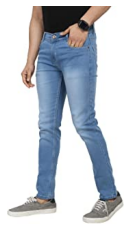

Predicted Label is: [2] 

Input Image is: img331.jpeg


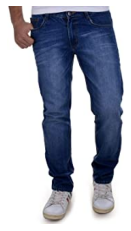

Predicted Label is: [2] 

Input Image is: img332.jpeg


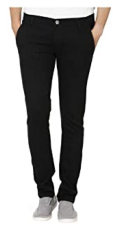

Predicted Label is: [2] 

Input Image is: img333.jpeg


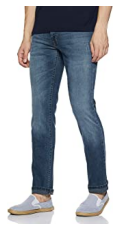

Predicted Label is: [2] 

Input Image is: img334.jpeg


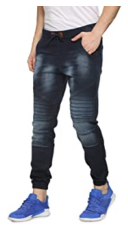

Predicted Label is: [2] 

Input Image is: img335.jpeg


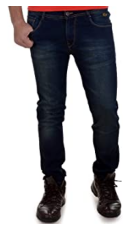

Predicted Label is: [0] 

Input Image is: img336.jpeg


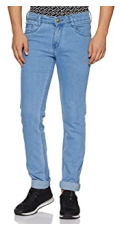

Predicted Label is: [2] 

Input Image is: img337.jpeg


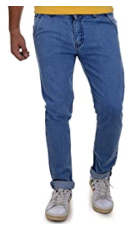

Predicted Label is: [0] 

Input Image is: img338.jpeg


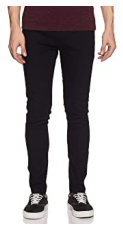

Predicted Label is: [2] 

Input Image is: img339.jpeg


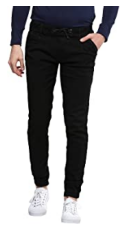

Predicted Label is: [2] 

Input Image is: img340.jpeg


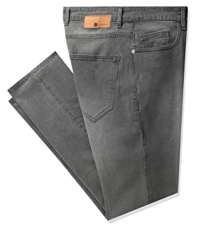

Predicted Label is: [2] 

Input Image is: img341.jpeg


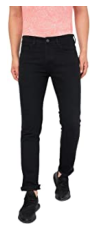

Predicted Label is: [0] 

Input Image is: img342.jpeg


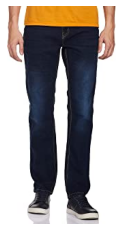

Predicted Label is: [0] 

Input Image is: img343.jpeg


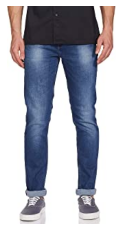

Predicted Label is: [2] 

Input Image is: img344.jpeg


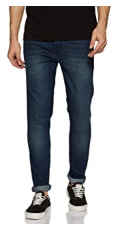

Predicted Label is: [2] 

Input Image is: img345.jpeg


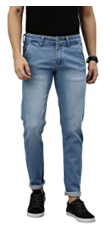

Predicted Label is: [2] 

Input Image is: img346.jpeg


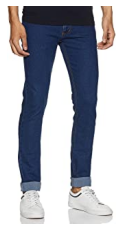

Predicted Label is: [2] 

Input Image is: img347.jpeg


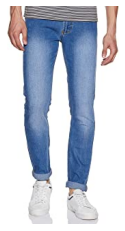

Predicted Label is: [2] 

Input Image is: img348.jpeg


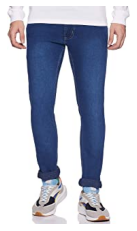

Predicted Label is: [0] 

Input Image is: img349.jpeg


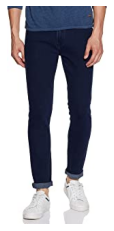

Predicted Label is: [2] 

Input Image is: img350.jpeg


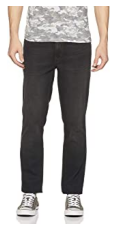

Predicted Label is: [2] 

Input Image is: img351.jpeg


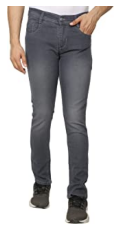

Predicted Label is: [2] 

Input Image is: img352.jpeg


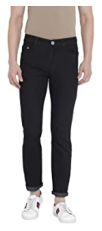

Predicted Label is: [0] 

Input Image is: img353.jpeg


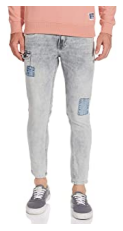

Predicted Label is: [2] 

Input Image is: img354.jpeg


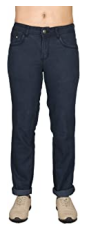

Predicted Label is: [0] 

Input Image is: img355.jpeg


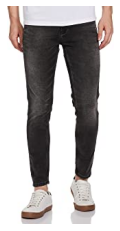

Predicted Label is: [2] 

Input Image is: img356.jpeg


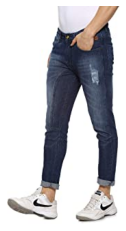

Predicted Label is: [2] 

Input Image is: img357.jpeg


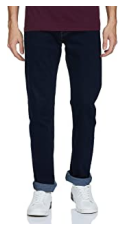

Predicted Label is: [0] 

Input Image is: img358.jpeg


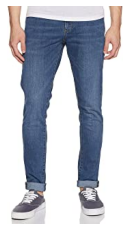

Predicted Label is: [2] 

Input Image is: img359.jpeg


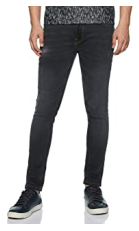

Predicted Label is: [2] 

Input Image is: img360.jpeg


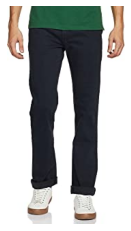

Predicted Label is: [2] 

Input Image is: img361.jpeg


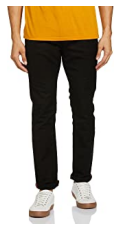

Predicted Label is: [0] 

Input Image is: img362.jpeg


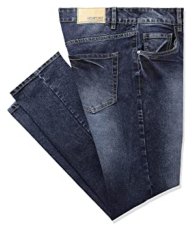

Predicted Label is: [2] 

Input Image is: img363.jpeg


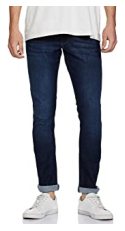

Predicted Label is: [0] 

Input Image is: img364.jpeg


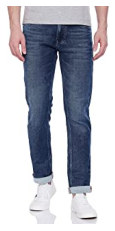

Predicted Label is: [0] 

Input Image is: img365.jpeg


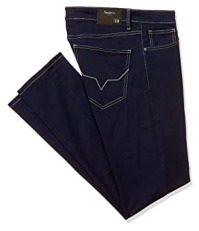

Predicted Label is: [0] 

Input Image is: img366.jpeg


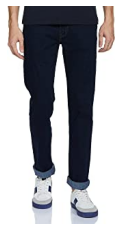

Predicted Label is: [0] 

Input Image is: img367.jpeg


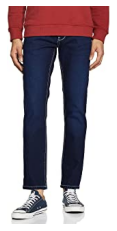

Predicted Label is: [0] 

Input Image is: img368.jpeg


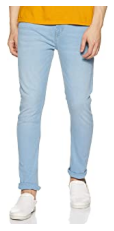

Predicted Label is: [0] 

Input Image is: img369.jpeg


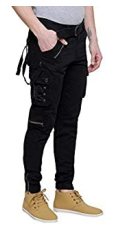

Predicted Label is: [0] 

Input Image is: img370.jpeg


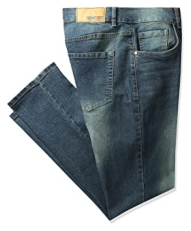

Predicted Label is: [0] 

Input Image is: img371.jpeg


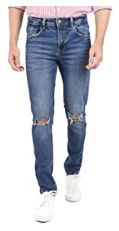

Predicted Label is: [2] 

Input Image is: img372.jpeg


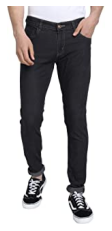

Predicted Label is: [2] 

Input Image is: img373.jpeg


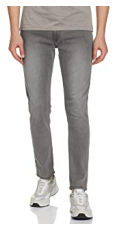

Predicted Label is: [2] 

Input Image is: img374.jpeg


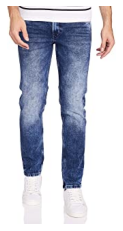

Predicted Label is: [2] 

Input Image is: img375.jpeg


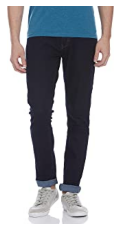

Predicted Label is: [2] 

Input Image is: img376.jpeg


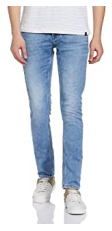

Predicted Label is: [2] 

Input Image is: img251.jpeg


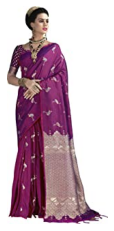

Predicted Label is: [1] 

Input Image is: img252.jpeg


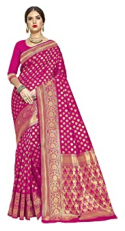

Predicted Label is: [1] 

Input Image is: img253.jpeg


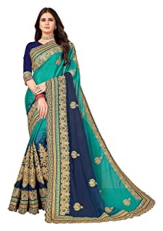

Predicted Label is: [1] 

Input Image is: img254.jpeg


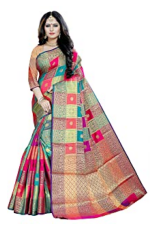

Predicted Label is: [1] 

Input Image is: img255.jpeg


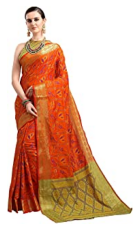

Predicted Label is: [1] 

Input Image is: img256.jpeg


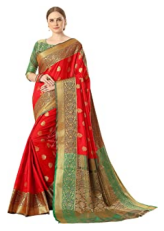

Predicted Label is: [1] 

Input Image is: img257.jpeg


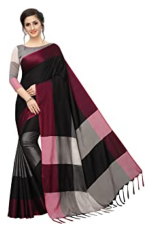

Predicted Label is: [1] 

Input Image is: img258.jpeg


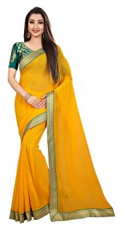

Predicted Label is: [1] 

Input Image is: img259.jpeg


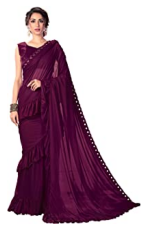

Predicted Label is: [1] 

Input Image is: img260.jpeg


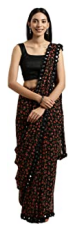

Predicted Label is: [1] 

Input Image is: img261.jpeg


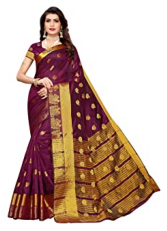

Predicted Label is: [1] 

Input Image is: img262.jpeg


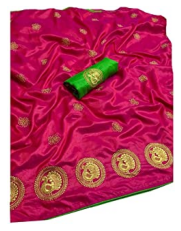

Predicted Label is: [1] 

Input Image is: img263.jpeg


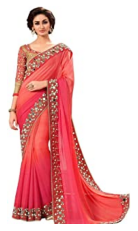

Predicted Label is: [1] 

Input Image is: img264.jpeg


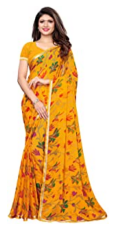

Predicted Label is: [1] 

Input Image is: img265.jpeg


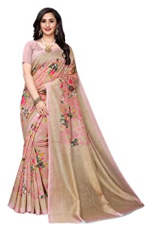

Predicted Label is: [1] 

Input Image is: img266.jpeg


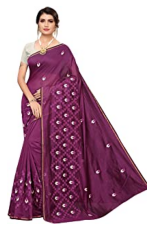

Predicted Label is: [1] 

Input Image is: img267.jpeg


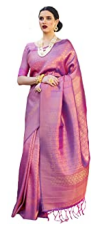

Predicted Label is: [1] 

Input Image is: img268.jpeg


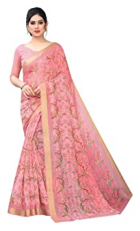

Predicted Label is: [1] 

Input Image is: img269.jpeg


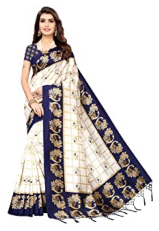

Predicted Label is: [1] 

Input Image is: img270.jpeg


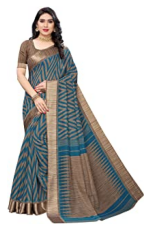

Predicted Label is: [1] 

Input Image is: img271.jpeg


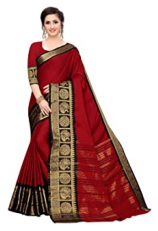

Predicted Label is: [1] 

Input Image is: img272.jpeg


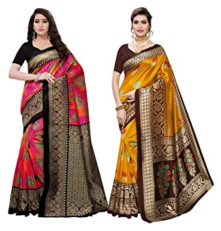

Predicted Label is: [1] 

Input Image is: img273.jpeg


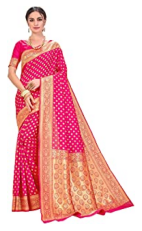

Predicted Label is: [1] 

Input Image is: img274.jpeg


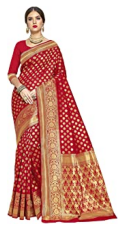

Predicted Label is: [1] 

Input Image is: img275.jpeg


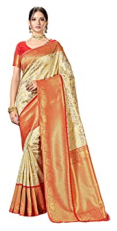

Predicted Label is: [1] 

Input Image is: img276.jpeg


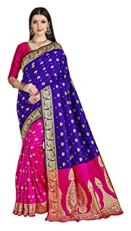

Predicted Label is: [1] 

Input Image is: img277.jpeg


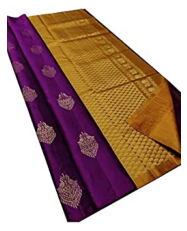

Predicted Label is: [1] 

Input Image is: img278.jpeg


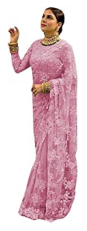

Predicted Label is: [1] 

Input Image is: img279.jpeg


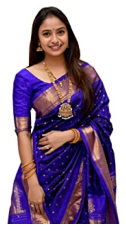

Predicted Label is: [1] 

Input Image is: img280.jpeg


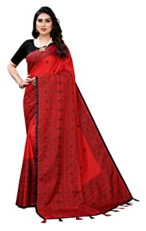

Predicted Label is: [1] 

Input Image is: img281.jpeg


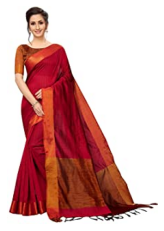

Predicted Label is: [1] 

Input Image is: img282.jpeg


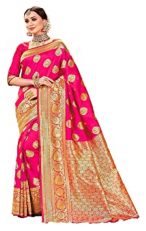

Predicted Label is: [1] 

Input Image is: img283.jpeg


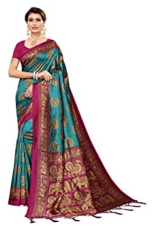

Predicted Label is: [1] 

Input Image is: img284.jpeg


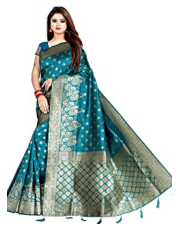

Predicted Label is: [1] 

Input Image is: img285.jpeg


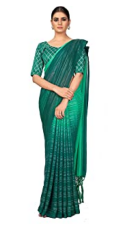

Predicted Label is: [1] 

Input Image is: img286.jpeg


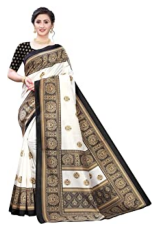

Predicted Label is: [1] 

Input Image is: img287.jpeg


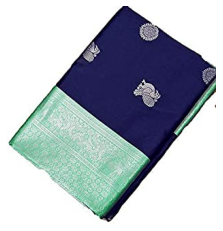

Predicted Label is: [2] 

Input Image is: img288.jpeg


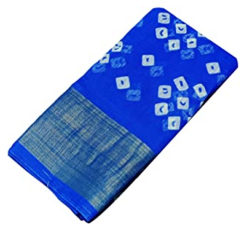

Predicted Label is: [1] 

Input Image is: img289.jpeg


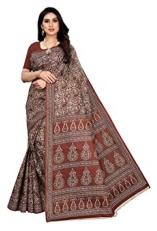

Predicted Label is: [1] 

Input Image is: img290.jpeg


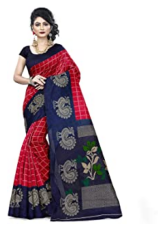

Predicted Label is: [1] 

Input Image is: img291.jpeg


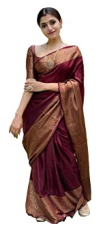

Predicted Label is: [1] 

Input Image is: img292.jpeg


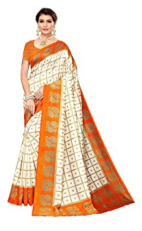

Predicted Label is: [1] 

Input Image is: img293.jpeg


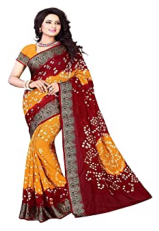

Predicted Label is: [1] 

Input Image is: img294.jpeg


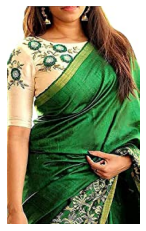

Predicted Label is: [1] 

Input Image is: img295.jpeg


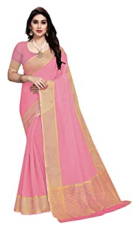

Predicted Label is: [1] 

Input Image is: img296.jpeg


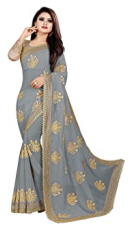

Predicted Label is: [2] 

Input Image is: img297.jpeg


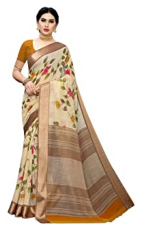

Predicted Label is: [1] 

Input Image is: img298.jpeg


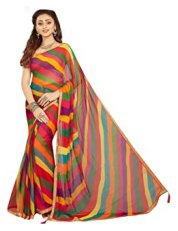

Predicted Label is: [1] 

Input Image is: img299.jpeg


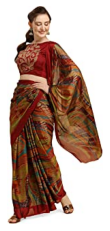

Predicted Label is: [1] 

Input Image is: img300.jpeg


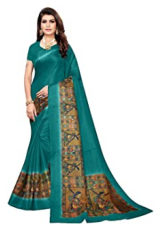

Predicted Label is: [1] 

Input Image is: img301.jpeg


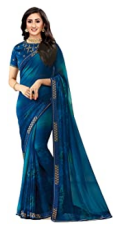

Predicted Label is: [1] 

Input Image is: img302.jpeg


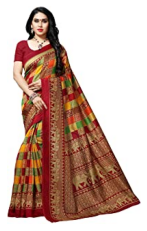

Predicted Label is: [1] 

Input Image is: img303.jpeg


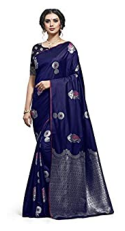

Predicted Label is: [1] 

Input Image is: img304.jpeg


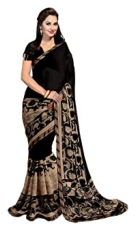

Predicted Label is: [1] 

Input Image is: img305.jpeg


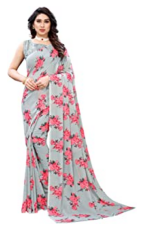

Predicted Label is: [1] 

Input Image is: img306.jpeg


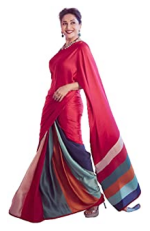

Predicted Label is: [1] 

Input Image is: img307.jpeg


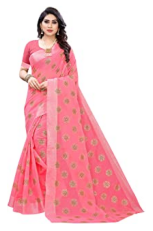

Predicted Label is: [1] 

Input Image is: img308.jpeg


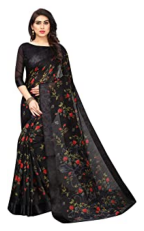

Predicted Label is: [1] 

Input Image is: img309.jpeg


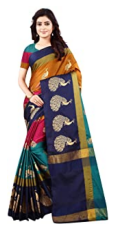

Predicted Label is: [1] 

Input Image is: img310.jpeg


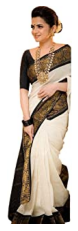

Predicted Label is: [1] 

Input Image is: img311.jpeg


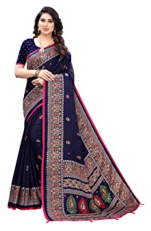

Predicted Label is: [1] 

Input Image is: img312.jpeg


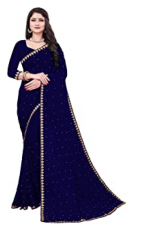

Predicted Label is: [1] 

Input Image is: img313.jpeg


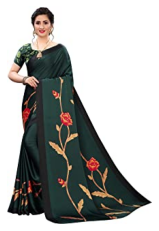

Predicted Label is: [1] 

Input Image is: img314.jpeg


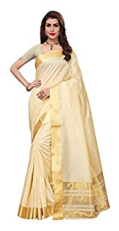

Predicted Label is: [1] 

Input Image is: img315.jpeg


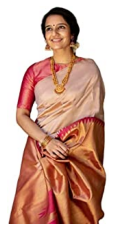

Predicted Label is: [1] 

Input Image is: img316.jpeg


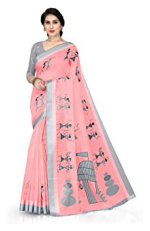

Predicted Label is: [1] 

Input Image is: img317.jpeg


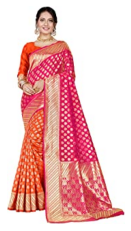

Predicted Label is: [1] 

Input Image is: img318.jpeg


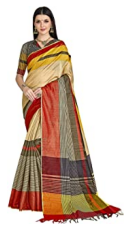

Predicted Label is: [1] 

Input Image is: img319.jpeg


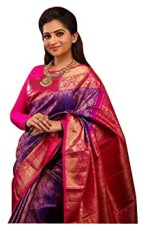

Predicted Label is: [1] 

Input Image is: img320.jpeg


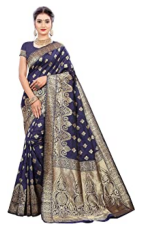

Predicted Label is: [1] 

Input Image is: img321.jpeg


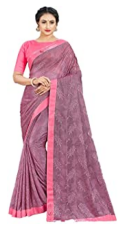

Predicted Label is: [1] 

Input Image is: img322.jpeg


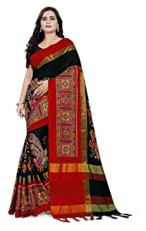

Predicted Label is: [1] 

Input Image is: img323.jpeg


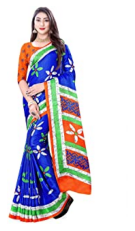

Predicted Label is: [1] 

Input Image is: img324.jpeg


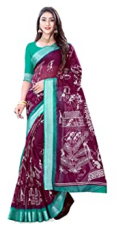

Predicted Label is: [1] 

Input Image is: img325.jpeg


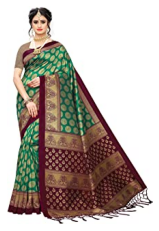

Predicted Label is: [1] 

Input Image is: img326.jpeg


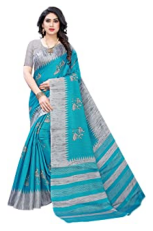

Predicted Label is: [1] 

Input Image is: img327.jpeg


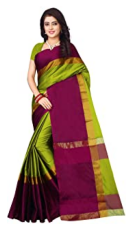

Predicted Label is: [1] 

Input Image is: img328.jpeg


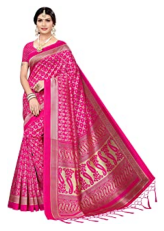

Predicted Label is: [1] 

Input Image is: img329.jpeg


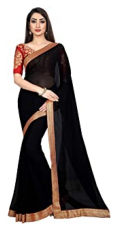

Predicted Label is: [1] 

Input Image is: img330.jpeg


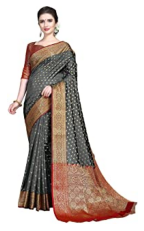

Predicted Label is: [1] 

Input Image is: img331.jpeg


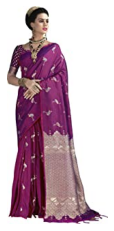

Predicted Label is: [1] 

Input Image is: img332.jpeg


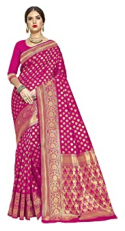

Predicted Label is: [1] 

Input Image is: img333.jpeg


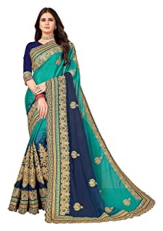

Predicted Label is: [1] 

Input Image is: img334.jpeg


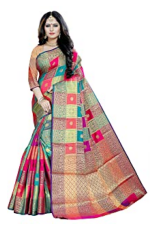

Predicted Label is: [1] 

Input Image is: img335.jpeg


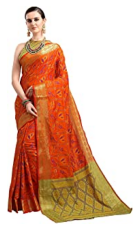

Predicted Label is: [1] 

Input Image is: img336.jpeg


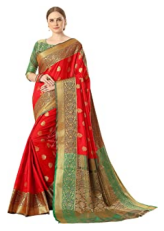

Predicted Label is: [1] 

Input Image is: img337.jpeg


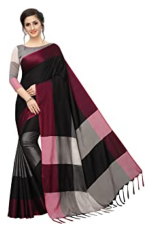

Predicted Label is: [1] 

Input Image is: img338.jpeg


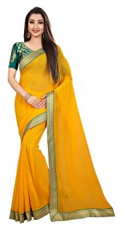

Predicted Label is: [1] 

Input Image is: img339.jpeg


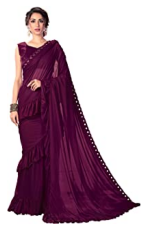

Predicted Label is: [1] 

Input Image is: img340.jpeg


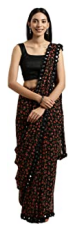

Predicted Label is: [1] 

Input Image is: img341.jpeg


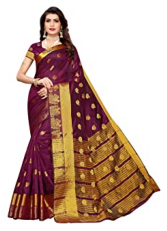

Predicted Label is: [1] 

Input Image is: img342.jpeg


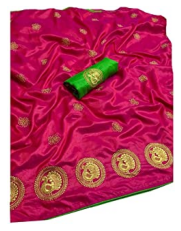

Predicted Label is: [1] 

Input Image is: img343.jpeg


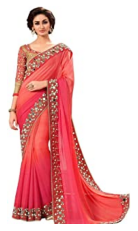

Predicted Label is: [1] 

Input Image is: img344.jpeg


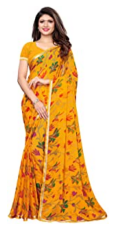

Predicted Label is: [1] 

Input Image is: img345.jpeg


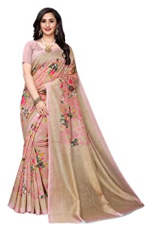

Predicted Label is: [1] 

Input Image is: img346.jpeg


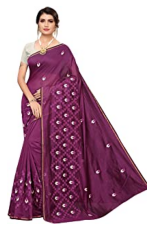

Predicted Label is: [1] 

Input Image is: img347.jpeg


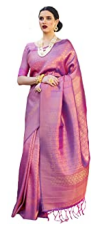

Predicted Label is: [1] 

Input Image is: img348.jpeg


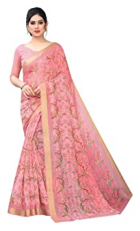

Predicted Label is: [1] 

Input Image is: img349.jpeg


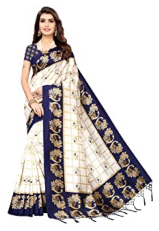

Predicted Label is: [1] 

Input Image is: img350.jpeg


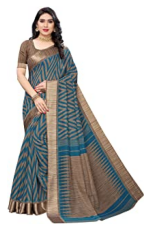

Predicted Label is: [1] 

Input Image is: img351.jpeg


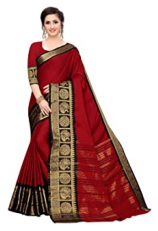

Predicted Label is: [1] 

Input Image is: img352.jpeg


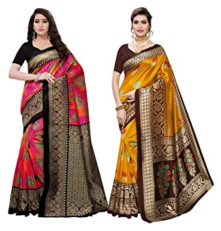

Predicted Label is: [1] 

Input Image is: img353.jpeg


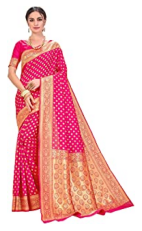

Predicted Label is: [1] 

Input Image is: img354.jpeg


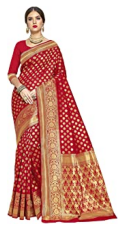

Predicted Label is: [1] 

Input Image is: img355.jpeg


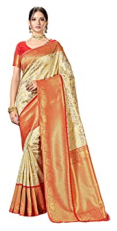

Predicted Label is: [1] 

Input Image is: img356.jpeg


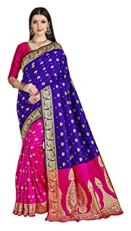

Predicted Label is: [1] 

Input Image is: img357.jpeg


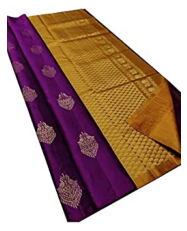

Predicted Label is: [1] 

Input Image is: img358.jpeg


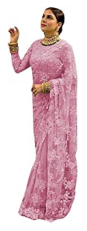

Predicted Label is: [1] 

Input Image is: img359.jpeg


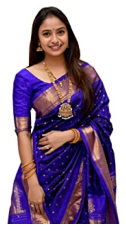

Predicted Label is: [1] 

Input Image is: img360.jpeg


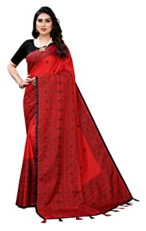

Predicted Label is: [1] 

Input Image is: img361.jpeg


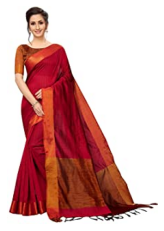

Predicted Label is: [1] 

Input Image is: img362.jpeg


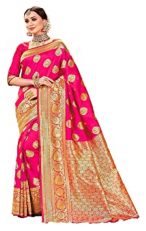

Predicted Label is: [1] 

Input Image is: img363.jpeg


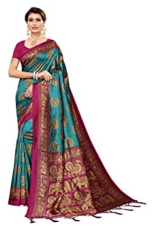

Predicted Label is: [1] 

Input Image is: img364.jpeg


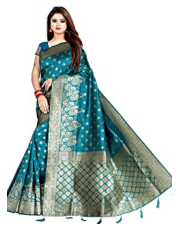

Predicted Label is: [1] 

Input Image is: img365.jpeg


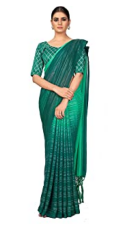

Predicted Label is: [1] 

Input Image is: img366.jpeg


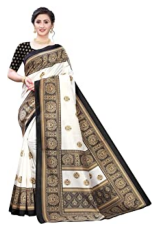

Predicted Label is: [1] 

Input Image is: img367.jpeg


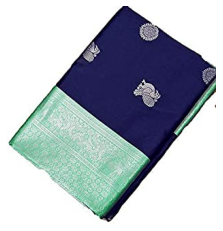

Predicted Label is: [2] 

Input Image is: img368.jpeg


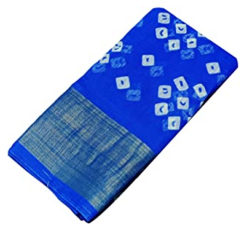

Predicted Label is: [1] 

Input Image is: img369.jpeg


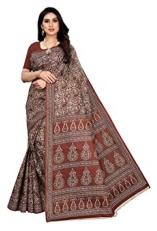

Predicted Label is: [1] 

Input Image is: img370.jpeg


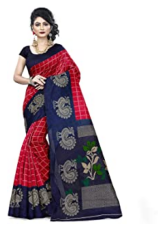

Predicted Label is: [1] 

Input Image is: img371.jpeg


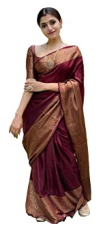

Predicted Label is: [1] 

Input Image is: img372.jpeg


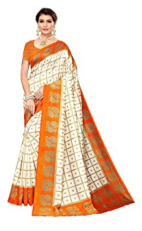

Predicted Label is: [1] 

Input Image is: img373.jpeg


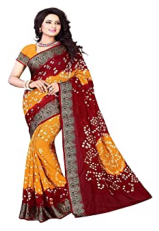

Predicted Label is: [1] 

Input Image is: img374.jpeg


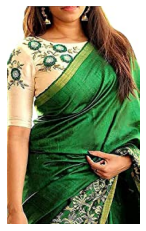

Predicted Label is: [1] 

Input Image is: img375.jpeg


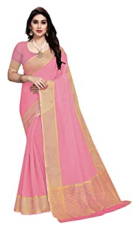

Predicted Label is: [1] 

Input Image is: img376.jpeg


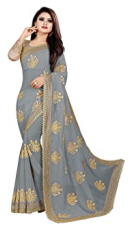

Predicted Label is: [2] 

Input Image is: img251.jpeg


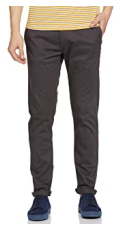

Predicted Label is: [0] 

Input Image is: img252.jpeg


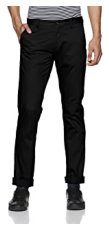

Predicted Label is: [2] 

Input Image is: img253.jpeg


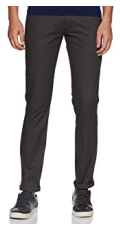

Predicted Label is: [2] 

Input Image is: img254.jpeg


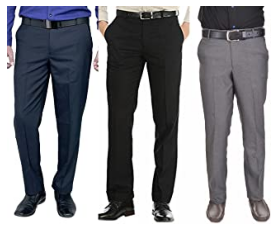

Predicted Label is: [2] 

Input Image is: img255.jpeg


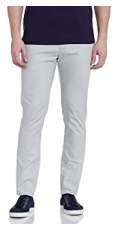

Predicted Label is: [2] 

Input Image is: img256.jpeg


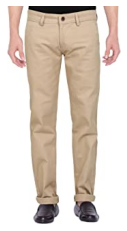

Predicted Label is: [2] 

Input Image is: img257.jpeg


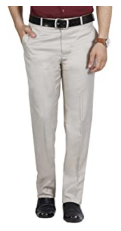

Predicted Label is: [2] 

Input Image is: img258.jpeg


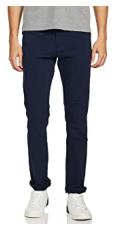

Predicted Label is: [0] 

Input Image is: img259.jpeg


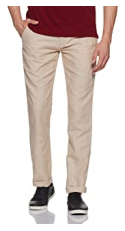

Predicted Label is: [2] 

Input Image is: img260.jpeg


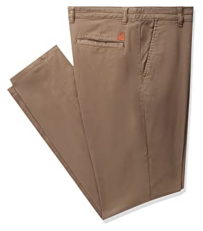

Predicted Label is: [2] 

Input Image is: img261.jpeg


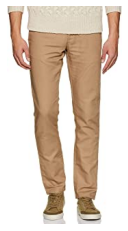

Predicted Label is: [2] 

Input Image is: img262.jpeg


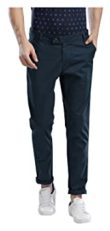

Predicted Label is: [2] 

Input Image is: img263.jpeg


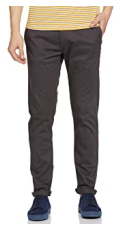

Predicted Label is: [0] 

Input Image is: img264.jpeg


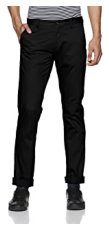

Predicted Label is: [2] 

Input Image is: img265.jpeg


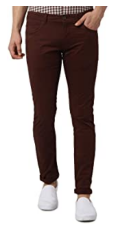

Predicted Label is: [2] 

Input Image is: img266.jpeg


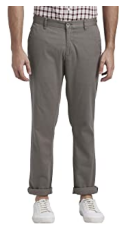

Predicted Label is: [2] 

Input Image is: img267.jpeg


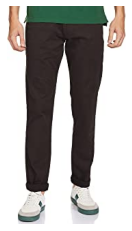

Predicted Label is: [2] 

Input Image is: img268.jpeg


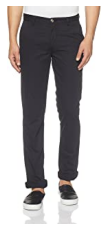

Predicted Label is: [2] 

Input Image is: img269.jpeg


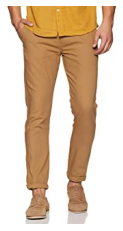

Predicted Label is: [2] 

Input Image is: img270.jpeg


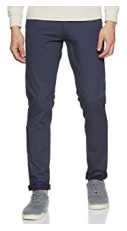

Predicted Label is: [2] 

Input Image is: img271.jpeg


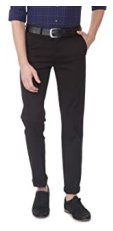

Predicted Label is: [2] 

Input Image is: img272.jpeg


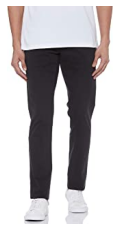

Predicted Label is: [2] 

Input Image is: img273.jpeg


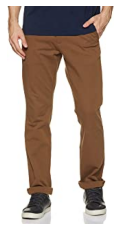

Predicted Label is: [2] 

Input Image is: img274.jpeg


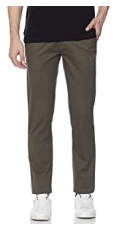

Predicted Label is: [2] 

Input Image is: img275.jpeg


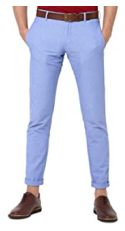

Predicted Label is: [2] 

Input Image is: img276.jpeg


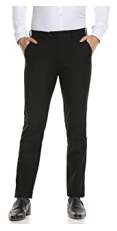

Predicted Label is: [2] 

Input Image is: img277.jpeg


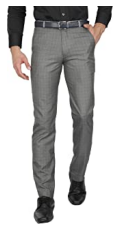

Predicted Label is: [2] 

Input Image is: img278.jpeg


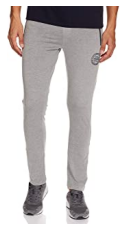

Predicted Label is: [2] 

Input Image is: img279.jpeg


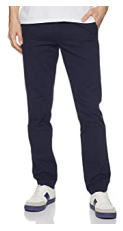

Predicted Label is: [2] 

Input Image is: img280.jpeg


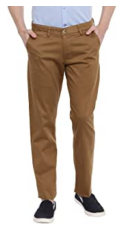

Predicted Label is: [2] 

Input Image is: img281.jpeg


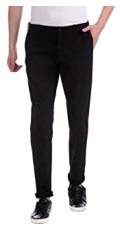

Predicted Label is: [2] 

Input Image is: img282.jpeg


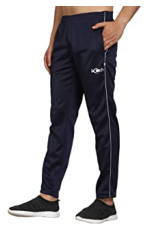

Predicted Label is: [0] 

Input Image is: img283.jpeg


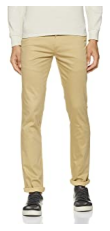

Predicted Label is: [2] 

Input Image is: img284.jpeg


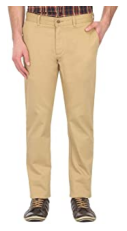

Predicted Label is: [2] 

Input Image is: img285.jpeg


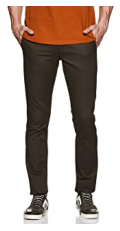

Predicted Label is: [0] 

Input Image is: img286.jpeg


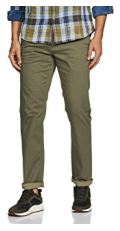

Predicted Label is: [2] 

Input Image is: img287.jpeg


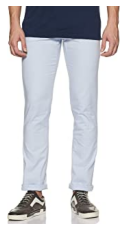

Predicted Label is: [2] 

Input Image is: img288.jpeg


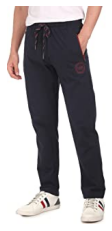

Predicted Label is: [2] 

Input Image is: img289.jpeg


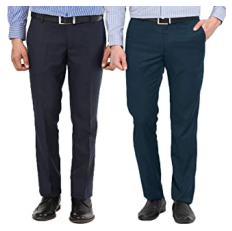

Predicted Label is: [2] 

Input Image is: img290.jpeg


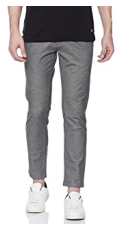

Predicted Label is: [2] 

Input Image is: img291.jpeg


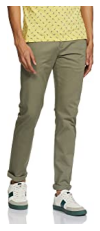

Predicted Label is: [2] 

Input Image is: img292.jpeg


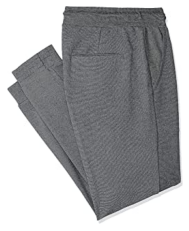

Predicted Label is: [2] 

Input Image is: img293.jpeg


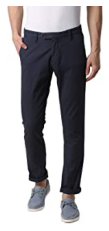

Predicted Label is: [2] 

Input Image is: img294.jpeg


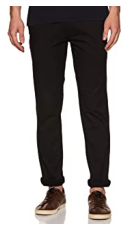

Predicted Label is: [2] 

Input Image is: img295.jpeg


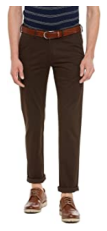

Predicted Label is: [2] 

Input Image is: img296.jpeg


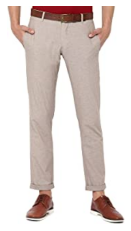

Predicted Label is: [2] 

Input Image is: img297.jpeg


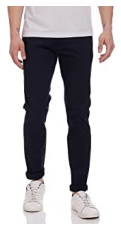

Predicted Label is: [2] 

Input Image is: img298.jpeg


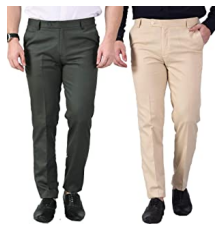

Predicted Label is: [2] 

Input Image is: img299.jpeg


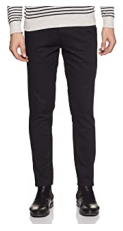

Predicted Label is: [2] 

Input Image is: img300.jpeg


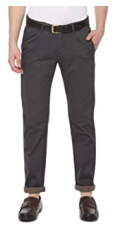

Predicted Label is: [2] 

Input Image is: img301.jpeg


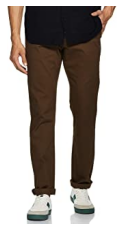

Predicted Label is: [2] 

Input Image is: img302.jpeg


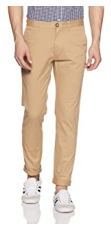

Predicted Label is: [2] 

Input Image is: img303.jpeg


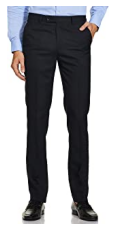

Predicted Label is: [2] 

Input Image is: img304.jpeg


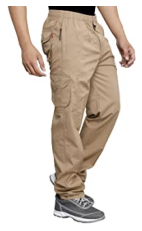

Predicted Label is: [2] 

Input Image is: img305.jpeg


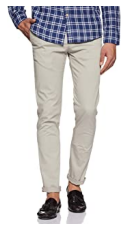

Predicted Label is: [2] 

Input Image is: img306.jpeg


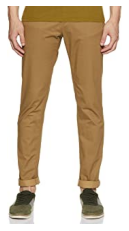

Predicted Label is: [2] 

Input Image is: img307.jpeg


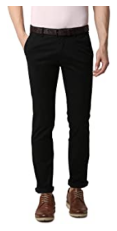

Predicted Label is: [0] 

Input Image is: img308.jpeg


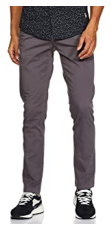

Predicted Label is: [2] 

Input Image is: img309.jpeg


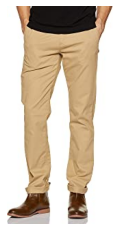

Predicted Label is: [2] 

Input Image is: img310.jpeg


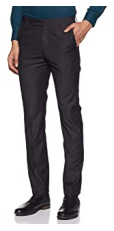

Predicted Label is: [2] 

Input Image is: img311.jpeg


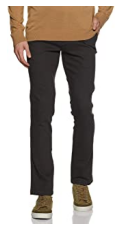

Predicted Label is: [0] 

Input Image is: img312.jpeg


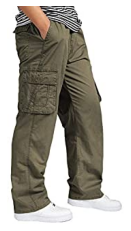

Predicted Label is: [2] 

Input Image is: img313.jpeg


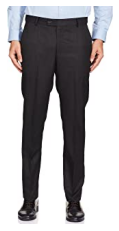

Predicted Label is: [2] 

Input Image is: img314.jpeg


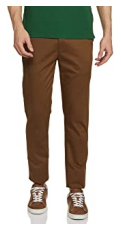

Predicted Label is: [2] 

Input Image is: img315.jpeg


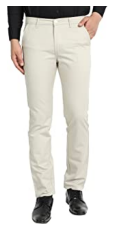

Predicted Label is: [2] 

Input Image is: img316.jpeg


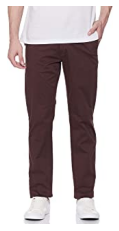

Predicted Label is: [2] 

Input Image is: img317.jpeg


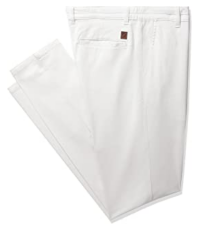

Predicted Label is: [2] 

Input Image is: img318.jpeg


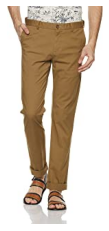

Predicted Label is: [2] 

Input Image is: img319.jpeg


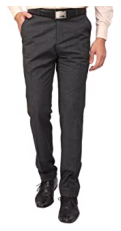

Predicted Label is: [2] 

Input Image is: img320.jpeg


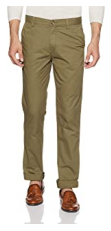

Predicted Label is: [2] 

Input Image is: img321.jpeg


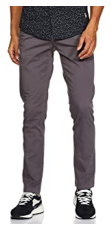

Predicted Label is: [2] 

Input Image is: img322.jpeg


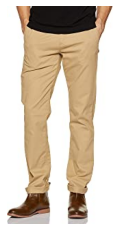

Predicted Label is: [2] 

Input Image is: img323.jpeg


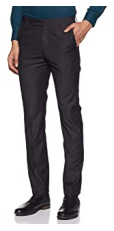

Predicted Label is: [2] 

Input Image is: img324.jpeg


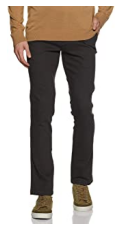

Predicted Label is: [0] 

Input Image is: img325.jpeg


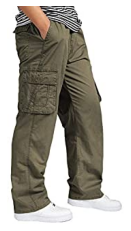

Predicted Label is: [2] 

Input Image is: img326.jpeg


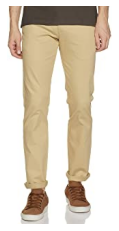

Predicted Label is: [2] 

Input Image is: img327.jpeg


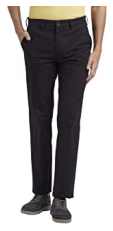

Predicted Label is: [0] 

Input Image is: img328.jpeg


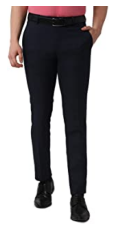

Predicted Label is: [0] 

Input Image is: img329.jpeg


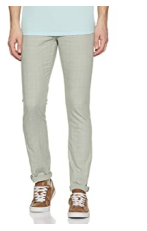

Predicted Label is: [2] 

Input Image is: img330.jpeg


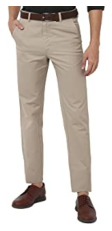

Predicted Label is: [2] 

Input Image is: img331.jpeg


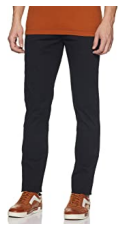

Predicted Label is: [0] 

Input Image is: img332.jpeg


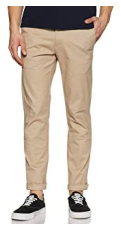

Predicted Label is: [2] 

Input Image is: img333.jpeg


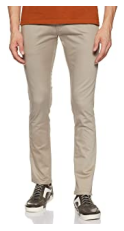

Predicted Label is: [2] 

Input Image is: img334.jpeg


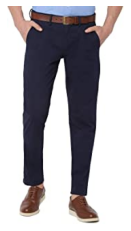

Predicted Label is: [2] 

Input Image is: img335.jpeg


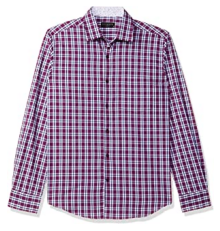

Predicted Label is: [1] 

Input Image is: img336.jpeg


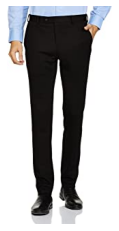

Predicted Label is: [2] 

Input Image is: img337.jpeg


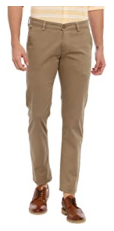

Predicted Label is: [2] 

Input Image is: img338.jpeg


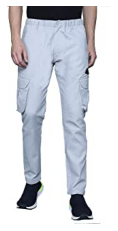

Predicted Label is: [2] 

Input Image is: img339.jpeg


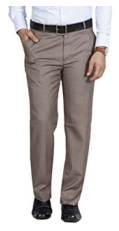

Predicted Label is: [2] 

Input Image is: img340.jpeg


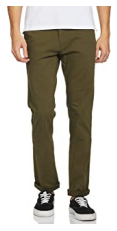

Predicted Label is: [2] 

Input Image is: img341.jpeg


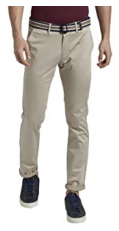

Predicted Label is: [2] 

Input Image is: img342.jpeg


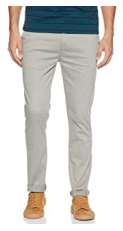

Predicted Label is: [2] 

Input Image is: img343.jpeg


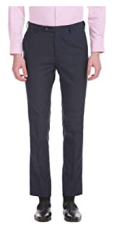

Predicted Label is: [2] 

Input Image is: img344.jpeg


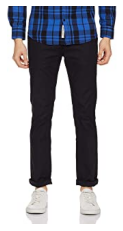

Predicted Label is: [0] 

Input Image is: img345.jpeg


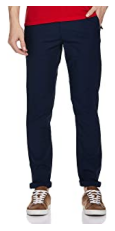

Predicted Label is: [2] 

Input Image is: img346.jpeg


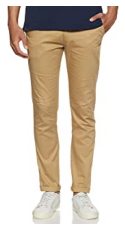

Predicted Label is: [2] 

Input Image is: img347.jpeg


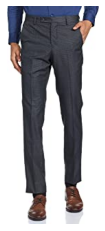

Predicted Label is: [2] 

Input Image is: img348.jpeg


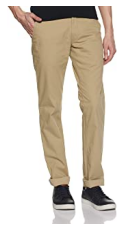

Predicted Label is: [2] 

Input Image is: img349.jpeg


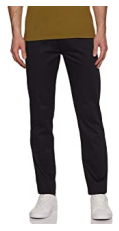

Predicted Label is: [0] 

Input Image is: img350.jpeg


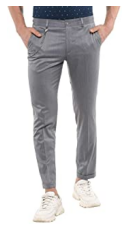

Predicted Label is: [2] 

Input Image is: img351.jpeg


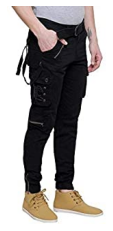

Predicted Label is: [0] 

Input Image is: img352.jpeg


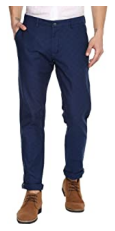

Predicted Label is: [2] 

Input Image is: img353.jpeg


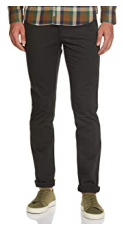

Predicted Label is: [0] 

Input Image is: img354.jpeg


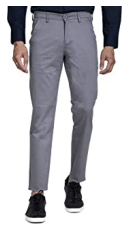

Predicted Label is: [2] 

Input Image is: img355.jpeg


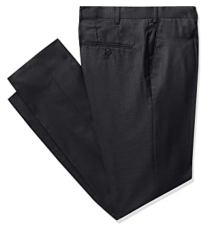

Predicted Label is: [2] 

Input Image is: img356.jpeg


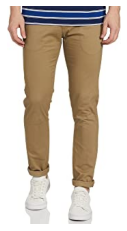

Predicted Label is: [2] 

Input Image is: img357.jpeg


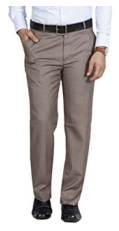

Predicted Label is: [2] 

Input Image is: img358.jpeg


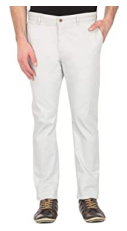

Predicted Label is: [2] 

Input Image is: img359.jpeg


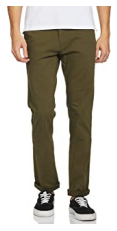

Predicted Label is: [2] 

Input Image is: img360.jpeg


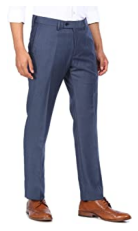

Predicted Label is: [2] 

Input Image is: img361.jpeg


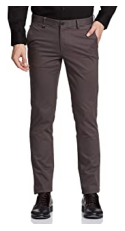

Predicted Label is: [2] 

Input Image is: img362.jpeg


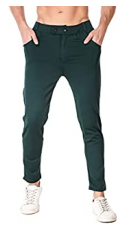

Predicted Label is: [0] 

Input Image is: img363.jpeg


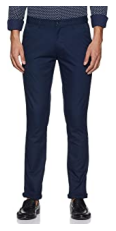

Predicted Label is: [2] 

Input Image is: img364.jpeg


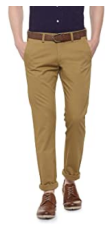

Predicted Label is: [2] 

Input Image is: img365.jpeg


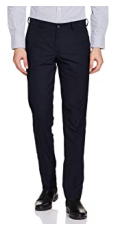

Predicted Label is: [2] 

Input Image is: img366.jpeg


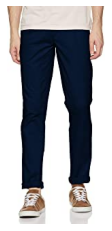

Predicted Label is: [0] 

Input Image is: img367.jpeg


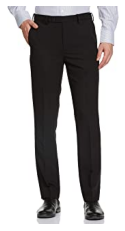

Predicted Label is: [2] 

Input Image is: img368.jpeg


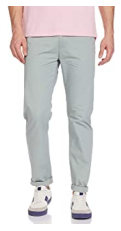

Predicted Label is: [2] 

Input Image is: img369.jpeg


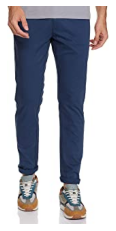

Predicted Label is: [0] 

Input Image is: img370.jpeg


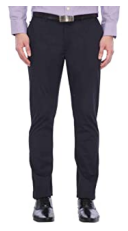

Predicted Label is: [2] 

Input Image is: img371.jpeg


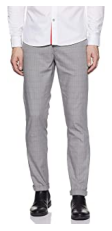

Predicted Label is: [2] 

Input Image is: img372.jpeg


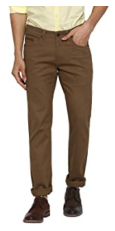

Predicted Label is: [2] 

Input Image is: img373.jpeg


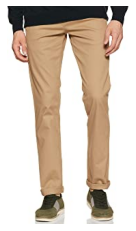

Predicted Label is: [2] 

Input Image is: img374.jpeg


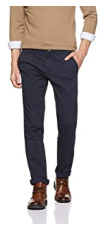

Predicted Label is: [0] 

Input Image is: img375.jpeg


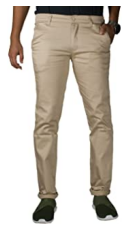

Predicted Label is: [2] 

Input Image is: img376.jpeg


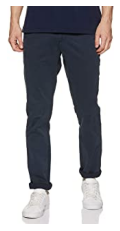

Predicted Label is: [2] 



In [17]:
test_dire=[test_jeans,test_saree,test_trouser]

for test_dir in test_dire:
    for i in listdir(test_dir):
        print("Input Image is:",i)
        img= image.load_img('{}/{}'.format(test_dir,i))                         
        test_image = image.load_img('{}/{}'.format(test_dir,i),target_size=(128, 128))
        test_image = image.img_to_array(test_image)
        plt.imshow(img)
        plt.axis('off')
        plt.show()
        test_image = np.expand_dims(test_image, axis=0)
        result = saved_model.predict(test_image)
        print("Predicted Label is:",np.argmax(result, axis=1),"\n")